In [1]:
from time import time, process_time
import numpy as np
from scipy.stats import norm
from sklearn import metrics
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import plotly.express as px
from dtw import *
from utility import *

homedir = get_homedir()

Importing the dtw module. When using in academic works please cite:
  T. Giorgino. Computing and Visualizing Dynamic Time Warping Alignments in R: The dtw Package.
  J. Stat. Soft., doi:10.18637/jss.v031.i07.



## Geolocation

In [2]:
FIPS_mapping, FIPS_full = get_FIPS(reduced=True)

In [3]:
raw_neighbor_counties = pd.read_csv(f"{homedir}/data/us/geolocation/neighborcounties.csv")
raw_neighbor_counties['orgfips'] = raw_neighbor_counties['orgfips'].apply(correct_FIPS)
raw_neighbor_counties['adjfips'] = raw_neighbor_counties['adjfips'].apply(correct_FIPS)
raw_neighbor_counties.replace(FIPS_mapping, inplace=True)

# Fill out missing county: 51560 Vlifton Forge City, in 51005 Alleghany County
raw_neighbor_counties.loc[raw_neighbor_counties.index.max() + 1] = ['51560', '51005', 1]
raw_neighbor_counties.loc[raw_neighbor_counties.index.max() + 1] = ['51005', '51560', 1]

raw_neighbor_counties.head()

,orgfips,adjfips,instate
0,01001,01021,1
1,01001,01047,1
2,01001,01051,1
3,01001,01085,1
4,01001,01101,1


In [4]:
# NOTE: df[["col1", "col2"]] does not actually copy data itself, just creates a separate view (i.e. like reference)
county_edges = list(raw_neighbor_counties[["orgfips","adjfips"]].to_records(index=False))
G = nx.Graph()

# Note: Try to add nodes in order first, for visualization purposes later
G.add_nodes_from(FIPS_full)
G.add_edges_from(county_edges)

# Ignore outlying areas under US sovereignty; GU(66), PR(72), VI(78)
# At any rate their coordinates are missing; can't draw
for fips in FIPS_full:
    if fips[:2]=='78' or fips[:2]=='72' or fips[:2]=='66':
        G.remove_node(fips)
# Ignore AK(02), HI(15) for visual issue
for fips in FIPS_full:
    if fips[:2]=='02' or fips[:2]=='15':
        G.remove_node(fips)

In [5]:
raw_county_centers = pd.read_csv(f"{homedir}/data/us/geolocation/county_centers.csv")
raw_county_centers['fips'] = raw_county_centers['fips'].apply(correct_FIPS)
raw_county_centers = raw_county_centers[['fips','clon10', 'clat10']].dropna()
raw_county_centers.replace(FIPS_mapping, inplace=True)

# Fill out missing county: 51560 Vlifton Forge City, surrounded by 51005 Alleghany County
raw_county_centers.loc[raw_county_centers.index.max() + 1] = ['51560', -79.823611, 37.819722]

location_dictionary = dict(zip(raw_county_centers['fips'].to_list(), list(raw_county_centers[['clon10', 'clat10']].to_numpy())))

# One brough in AK has positive longitude; should subtract by 360 for visual easiness

# counter = 0
# lowerleft = [raw_county_centers['clon10'].min(), raw_county_centers['clat10'].min()]
# county_removal = []
# for fips in G.nodes:
#     if fips not in location_dictionary.keys():
#         # location_dictionary[fips] = [lowerleft[0]+0.5*counter, lowerleft[1]]
#         # counter += 1
#         county_removal.append(fips)
# for fips in county_removal:
#     G.remove_node(fips)

In [6]:
# Compute distance to the closest neighbor
dist_min_dict = {}
for fips in G.nodes:
    coor_org = np.array(location_dictionary[fips])
    dist_min = np.inf
    for adj in G[fips]:
        coor_adj = np.array(location_dictionary[adj])
        dist_min = min(dist_min, np.linalg.norm(coor_org-coor_adj))
    dist_min_dict[fips] = 300*max(dist_min, 0.001)**2

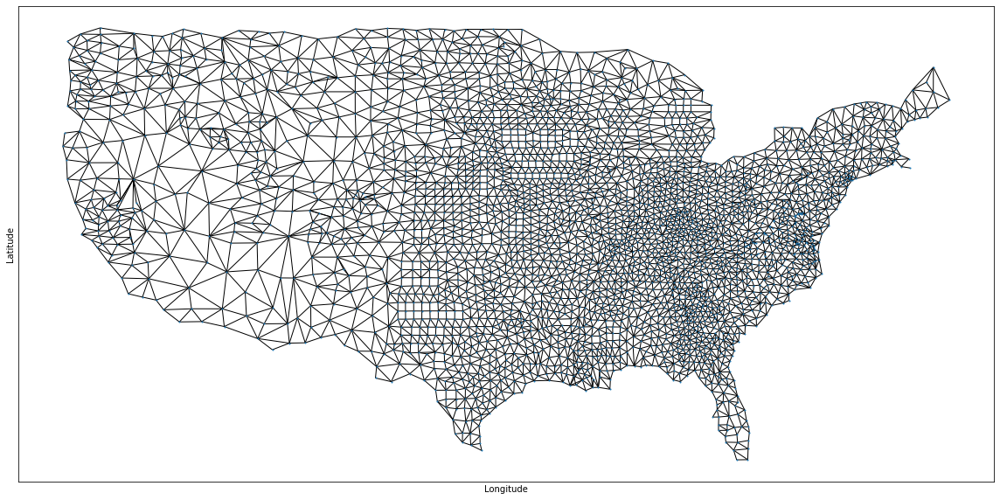

In [7]:
plt.figure(figsize=(20,10))
nx.drawing.nx_pylab.draw_networkx(
        G, 
        pos=location_dictionary,
        node_size=1,
        with_labels=False)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

## Berkeley dataset

In [8]:
berkeley = pd.read_csv(f"{homedir}/data/us/aggregate_berkeley.csv", index_col=0)
berkeley["countyFIPS"] = berkeley["countyFIPS"].apply(correct_FIPS)
berkeley = fix_FIPS(berkeley, fipslabel='countyFIPS', reduced=True)
berkeley.head()

,countyFIPS,PopulationEstimate2018,Population(Persons)2017,PopTotalMale2017,PopTotalFemale2017,FracMale2017,PopulationEstimate65+2017,PopulationDensityperSqMile2010,CensusPopulation2010,MedianAge2010,...,3-YrMortalityAge5-14Years2015-17,3-YrMortalityAge15-24Years2015-17,3-YrMortalityAge25-34Years2015-17,3-YrMortalityAge35-44Years2015-17,3-YrMortalityAge45-54Years2015-17,3-YrMortalityAge55-64Years2015-17,3-YrMortalityAge65-74Years2015-17,3-YrMortalityAge75-84Years2015-17,3-YrMortalityAge85+Years2015-17,mortality2015-17Estimated
0,01001,55601.0,55504.0,27007.0,28497.0,0.486578,8392.0,91.8,54571.0,37.0,...,0.0,0.0,10.0,20.0,44.0,73.0,112.0,143.0,109.0,33.194755
1,01003,218022.0,212628.0,103225.0,109403.0,0.485472,42413.0,114.7,182265.0,41.1,...,0.0,23.0,30.0,52.0,125.0,262.0,434.0,546.0,597.0,148.887537
2,01005,24881.0,25270.0,13335.0,11935.0,0.527701,4757.0,31.0,27457.0,39.0,...,0.0,0.0,0.0,0.0,21.0,44.0,65.0,72.0,68.0,18.483155
3,01007,22400.0,22668.0,12138.0,10530.0,0.535469,3632.0,36.8,22915.0,37.8,...,0.0,0.0,0.0,0.0,24.0,37.0,62.0,56.0,45.0,15.381366
4,01009,57840.0,58013.0,28607.0,29406.0,0.493114,10351.0,88.9,57322.0,39.0,...,0.0,10.0,13.0,25.0,49.0,94.0,150.0,182.0,142.0,48.499442


In [9]:
print(set(berkeley['countyFIPS']).difference(set(G.nodes)), set(G.nodes).difference(set(berkeley['countyFIPS'])))

{'15007', '02020', '02013', '15003', '02016', '15009', '15001'} {'46113', '51515', '51560'}


In [10]:
berkeley[['countyFIPS', 'PopTotalMale2017', 'PopTotalFemale2017', 'PopulationEstimate65+2017', 'PopulationDensityperSqMile2010', 'MedicareEnrollment,AgedTot2017', '#Hospitals', '#ICU_beds']].head()

,countyFIPS,PopTotalMale2017,PopTotalFemale2017,PopulationEstimate65+2017,PopulationDensityperSqMile2010,"MedicareEnrollment,AgedTot2017",#Hospitals,#ICU_beds
0,01001,27007.0,28497.0,8392.0,91.8,8046.0,1,6
1,01003,103225.0,109403.0,42413.0,114.7,41590.0,3,51
2,01005,13335.0,11935.0,4757.0,31.0,4706.0,1,5
3,01007,12138.0,10530.0,3632.0,36.8,3389.0,1,0
4,01009,28607.0,29406.0,10351.0,88.9,9542.0,1,6


In [11]:
popularity_type= ['PopMale<52010',
       'PopFmle<52010', 'PopMale5-92010', 'PopFmle5-92010', 'PopMale10-142010',
       'PopFmle10-142010', 'PopMale15-192010', 'PopFmle15-192010',
       'PopMale20-242010', 'PopFmle20-242010', 'PopMale25-292010',
       'PopFmle25-292010', 'PopMale30-342010', 'PopFmle30-342010',
       'PopMale35-442010', 'PopFmle35-442010', 'PopMale45-542010',
       'PopFmle45-542010', 'PopMale55-592010', 'PopFmle55-592010',
       'PopMale60-642010', 'PopFmle60-642010', 'PopMale65-742010',
       'PopFmle65-742010', 'PopMale75-842010', 'PopFmle75-842010',
       'PopMale>842010', 'PopFmle>842010']
popularity_type_Male = popularity_type[::2]
popularity_type_Fmle = popularity_type[1::2]
motality_type = ['3-YrMortalityAge<1Year2015-17',
       '3-YrMortalityAge1-4Years2015-17', '3-YrMortalityAge5-14Years2015-17',
       '3-YrMortalityAge15-24Years2015-17',
       '3-YrMortalityAge25-34Years2015-17',
       '3-YrMortalityAge35-44Years2015-17',
       '3-YrMortalityAge45-54Years2015-17',
       '3-YrMortalityAge55-64Years2015-17',
       '3-YrMortalityAge65-74Years2015-17',
       '3-YrMortalityAge75-84Years2015-17', '3-YrMortalityAge85+Years2015-17']
berkeley_tidy = berkeley.melt(id_vars="countyFIPS", value_vars=popularity_type_Male, var_name='', value_name='PopMale2010')
berkeley_tidy.head()

,countyFIPS,,PopMale2010
0,01001,PopMale<52010,1866.0
1,01003,PopMale<52010,5614.0
2,01005,PopMale<52010,847.0
3,01007,PopMale<52010,712.0
4,01009,PopMale<52010,1805.0


In [12]:
# berkeley["NeighborCounties"] = berkeley["countyFIPS"].apply(lambda x: list(G.neighbors(x)))
# berkeley.head()

## Clustering

In [13]:
colormap_str = ['red', 'darkgreen', 'blue', 'yellow', 'cyan', 'magenta', 'lime', 'indigo', 'silver']
# colormap_str = ['#0077bb', '#33bbee', '#009988', '#ee7733', '#cc3311', '#ee3377', '#332288', '#117733', '#dddddd']
# light color scheme

In [14]:
kNNdata = pd.DataFrame()
kNNdata['countyFIPS'] = berkeley['countyFIPS']
kNNdata['PopRatioMale2017'] = berkeley['PopTotalMale2017'] / (berkeley['PopTotalMale2017']+berkeley['PopTotalFemale2017'])
kNNdata['PopRatio65+2017'] = berkeley['PopulationEstimate65+2017'] / (berkeley['PopTotalMale2017']+berkeley['PopTotalFemale2017'])
kNNdata['PopulationDensityperSqMile2010'] = berkeley['PopulationDensityperSqMile2010'] / 260
kNNdata['MedicareEnrollment,AgedTot2017'] = berkeley['MedicareEnrollment,AgedTot2017'] / (berkeley['PopTotalMale2017']+berkeley['PopTotalFemale2017'])
kNNdata['#Hospitals'] = 20000 * berkeley['#Hospitals'] / (berkeley['PopTotalMale2017']+berkeley['PopTotalFemale2017'])
kNNdata['#ICU_beds'] = 10000 * berkeley['#ICU_beds'] / (berkeley['PopTotalMale2017']+berkeley['PopTotalFemale2017'])

kNNdata.head()

,countyFIPS,PopRatioMale2017,PopRatio65+2017,PopulationDensityperSqMile2010,"MedicareEnrollment,AgedTot2017",#Hospitals,#ICU_beds
0,01001,0.486578,0.151196,0.353077,0.144963,0.360334,1.081003
1,01003,0.485472,0.199470,0.441154,0.195600,0.282183,2.398555
2,01005,0.527701,0.188247,0.119231,0.186229,0.791452,1.978631
3,01007,0.535469,0.160226,0.141538,0.149506,0.882301,0.000000
4,01009,0.493114,0.178426,0.341923,0.164480,0.344750,1.034251


In [15]:
from sklearn.cluster import MiniBatchKMeans

N_clusters = 5

X = kNNdata.drop(columns=['countyFIPS']).to_numpy()
kmeans = MiniBatchKMeans(n_clusters=N_clusters)
kmeans.fit(X)
kmeans.labels_

array([0, 3, 3, ..., 3, 0, 0])

In [16]:
classes = dict(zip(list(kNNdata['countyFIPS']), kmeans.labels_))
for fips in set(G.nodes).difference(set(berkeley['countyFIPS'])):
    classes[fips] = N_clusters

with open(f'{homedir}/JK/clustering/n_clusters={N_clusters}_kmeans.txt', 'w') as f:
    print(classes, file=f)
# with open(f'{homedir}/JK/clustering/n_clusters={N_clusters}_kmeans.txt', 'r') as f:
#     classes = eval(f.read())

print(f'Number of clusters: {N_clusters}')
print('Size of clusters:', list(list(classes.values()).count(i) for i in range(N_clusters+1)))
print(f"Silhouette Coefficient: {metrics.silhouette_score(X, kmeans.labels_):.3f}")

Number of clusters: 5
Size of clusters: [2018, 138, 13, 797, 148, 3]
Silhouette Coefficient: 0.470


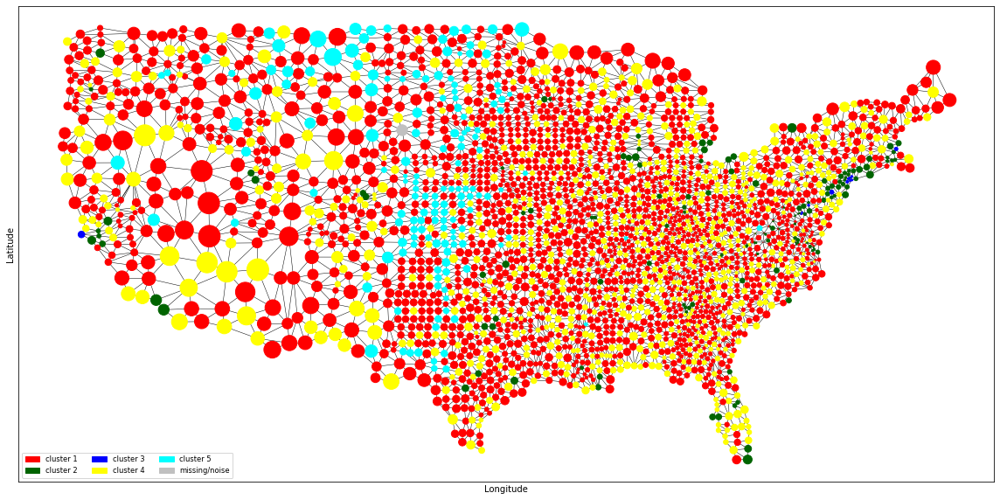

In [17]:
colormap_nodes = []
for fips in G.nodes:
    if classes[fips]==N_clusters:
        colormap_nodes.append(colormap_str[-1])
    else:
        colormap_nodes.append(colormap_str[classes[fips]])

plt.figure(figsize=(20,10))
nx.drawing.nx_pylab.draw_networkx(
        G, 
        pos=location_dictionary,
        node_size=list(dist_min_dict.values()), #10,
        node_color=colormap_nodes,
        width=0.5,
        with_labels=False,
        label='a')
plt.xlabel("Longitude")
plt.ylabel("Latitude")

patchs = []
for i in range(N_clusters):
    patchs.append(mpatches.Patch(color=colormap_str[i], label=f'cluster {i+1}'))
patchs.append(mpatches.Patch(color='silver', label='missing/noise'))

plt.legend(handles=patchs, fontsize='small', ncol=-(-len(patchs)//2), loc='lower left')
plt.show()

In [18]:
# show on a map - whole data set
from urllib.request import urlopen
import json

with open(f'{homedir}/JK/clustering/n_clusters=8_kmeans.txt', 'r') as f:
    classes = eval(f.read())

cluster_df = pd.DataFrame({'fips':list(classes.keys()), 'class':[str(i) for i in list(classes.values())]})
colormap_dict = dict(zip([str(i) for i in range(len(colormap_str))], colormap_str))

with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

fig = px.choropleth_mapbox(cluster_df, geojson=counties, locations='fips', color='class',
                        #    featureidkey="properties.error",
                           color_discrete_map=colormap_dict,
                           mapbox_style="carto-positron",
                           zoom=3, center = {"lat": 37.0902, "lon": -95.7129},
                           opacity=0.5,
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

with open(f'{homedir}/JK/plotly/n_clusters=8_kmeans.html', 'a') as f:
    f.write(fig.to_html(full_html=False, include_plotlyjs='cdn'))

In [19]:
minclass = 0
for i in range(N_clusters):
    if list(classes.values()).count(minclass)>list(classes.values()).count(i):
        minclass = i

fips_to_county_name = pd.read_csv(f"{homedir}/data/us/processing_data/fips_key.csv", encoding='latin-1')
fips_to_county_name['FIPS'] = fips_to_county_name['FIPS'].apply(correct_FIPS)
# dum = []
# for i, c in classes.items():
#     if c==minclass:
#         dum.append(i)
# with open(f'{homedir}/JK/clustering/counties_{colormap_str[minclass]}.txt', 'w') as f:
#     for fips in dum:
#         if len(fips_to_county_name[fips_to_county_name['FIPS']==fips])==1:
#             print(fips, fips_to_county_name[fips_to_county_name['FIPS']==fips]['COUNTY'].iloc[0], file=f)
#         else:
#             print(fips, file=f)

In [20]:
# dum = []
# for i, c in classes.items():
#     if c==4:
#         dum.append(i)
# with open(f'{homedir}/JK/clustering/counties_{colormap_str[4]}.txt', 'w') as f:
#     for fips in dum:
        # if len(fips_to_county_name[fips_to_county_name['FIPS']==fips])==1:
#             print(fips, fips_to_county_name[fips_to_county_name['FIPS']==fips]['COUNTY'].iloc[0], file=f)
#         else:
#             print(fips, file=f)

### Birch Clustering

In [33]:
from sklearn.cluster import Birch

N_clusters = 5

brc = Birch(threshold=0.1, n_clusters=N_clusters)
brc.fit(X)
brc.labels_

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [34]:
classes_brc = dict(zip(list(kNNdata['countyFIPS']), brc.labels_))
for fips in set(G.nodes).difference(set(berkeley['countyFIPS'])):
    classes_brc[fips] = N_clusters

with open(f'{homedir}/JK/clustering/n_clusters={N_clusters}_brc.txt', 'w') as f:
    print(classes_brc, file=f)
# with open(f'{homedir}/JK/clustering/n_clusters={N_clusters}_brc.txt', 'r') as f:
#     classes_brc = eval(f.read())

print(f'Number of clusters: {N_clusters}')
print('Size of clusters:', list(list(classes_brc.values()).count(i) for i in range(N_clusters+1)))
print(f"Silhouette Coefficient: {metrics.silhouette_score(X, brc.labels_):.3f}")

Number of clusters: 5
Size of clusters: [3100, 2, 10, 1, 1, 3]
Silhouette Coefficient: 0.923


Birch do not perform meaningful clustering

## Similarity measure

In [28]:
deaths = pd.read_csv(f"{homedir}/data/us/covid/deaths.csv")
deaths.drop(['County Name', 'State','stateFIPS'], axis=1, inplace=True)
deaths['countyFIPS'] = deaths['countyFIPS'].apply(correct_FIPS)
deaths = fix_FIPS(deaths, fipslabel='countyFIPS', reduced=True)
deaths = deaths[deaths['countyFIPS']!='0']
deaths = deaths[deaths['countyFIPS']!='1']
deaths = deaths[deaths['countyFIPS']!='06000']

deaths.set_index('countyFIPS', inplace=True)
deaths.tail()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20
countyFIPS,,,,,,,,,,,,,,,,,,,,,
56037,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
56039,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
56041,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
56043,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
56045,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [31]:
subclass = []
for i, c in classes.items():
    if c==0:
        subclass.append(i)
costlist = []
for i in range(len(subclass)):
    for j in range(i+1, len(subclass)):
        x = deaths.loc[subclass[i]].to_numpy()
        y = deaths.loc[subclass[j]].to_numpy()
        ds = dtw(x, y, dist_method='euclidean', step_pattern='symmetric2', window_type='itakura', distance_only=True)
        
        costlist.append(ds.normalizedDistance)
print(np.mean(costlist))

1.192307692307692


In [56]:
cost = []
for k in range(N_clusters):
    start_time = process_time()
    subclass = []
    for i, c in classes.items():
        if c==k:
            subclass.append(i)
    costlist = []
    for i in range(len(subclass)):
        for j in range(i+1, len(subclass)):
            x = deaths.loc[subclass[i]].to_numpy()
            y = deaths.loc[subclass[j]].to_numpy()
            ds = dtw(x, y, dist_method='euclidean', step_pattern='symmetric2', window_type='itakura', distance_only=True)
            
            costlist.append(ds.normalizedDistance)
    cost.append(np.mean(costlist))
    print(process_time() - start_time)
print(cost)
# np.savetxt(f'{homedir}/JK/clustering/n_clusters=8_kmeans_dist.txt', np.array(cost), delimiter=',')

4727.671875
35.65625
2.0625
49.78125
14.765625
466.375
897.484375
[0.2806400266643741, 0.0025775025287029974, 98.42862338607019, 15.760576764485721, 0.7453122993278821, 0.04905586222912982, 0.8113670941176058]


## Extended Demo features

In [38]:
kNNdata = pd.DataFrame()
kNNdata['countyFIPS'] = berkeley['countyFIPS']
kNNdata['PopRatioMale2017'] = berkeley['PopTotalMale2017'] / (berkeley['PopTotalMale2017']+berkeley['PopTotalFemale2017'])
kNNdata['PopRatio65+2017'] = berkeley['PopulationEstimate65+2017'] / (berkeley['PopTotalMale2017']+berkeley['PopTotalFemale2017'])
kNNdata['PopulationDensityperSqMile2010'] = berkeley['PopulationDensityperSqMile2010'] / 260
kNNdata['MedicareEnrollment,AgedTot2017'] = berkeley['MedicareEnrollment,AgedTot2017'] / (berkeley['PopTotalMale2017']+berkeley['PopTotalFemale2017'])
kNNdata['#Hospitals'] = 20000 * berkeley['#Hospitals'] / (berkeley['PopTotalMale2017']+berkeley['PopTotalFemale2017'])
kNNdata['#ICU_beds'] = 10000 * berkeley['#ICU_beds'] / (berkeley['PopTotalMale2017']+berkeley['PopTotalFemale2017'])
for i in range(len(popularity_type_Male)):
    kNNdata['PopRatio'+popularity_type_Male[i][3:]] = berkeley[popularity_type_Male[i]] / (berkeley[popularity_type_Male[i]]+berkeley[popularity_type_Fmle[i]])
    kNNdata['PopRatio'+popularity_type_Male[i][7:]] = berkeley[popularity_type_Male[i]] / (berkeley['PopTotalMale2017']+berkeley['PopTotalFemale2017'])
kNNdata['HeartDiseaseMortality'] = berkeley['HeartDiseaseMortality'] / 100
kNNdata['StrokeMortality'] = berkeley['StrokeMortality'] / 50
kNNdata['DiabetesPercentage'] = berkeley['DiabetesPercentage'] / 10
kNNdata['Smokers_Percentage'] = (berkeley['Smokers_Percentage'] - 2) / 20

kNNdata.fillna(0, inplace=True)

In [53]:
N_clusters = 5

X = kNNdata.drop(columns=['countyFIPS']).to_numpy()
kmeans = MiniBatchKMeans(n_clusters=N_clusters)
kmeans.fit(X)
kmeans.labels_

array([2, 1, 1, ..., 1, 2, 2])

In [55]:
classes = dict(zip(list(kNNdata['countyFIPS']), kmeans.labels_))
for fips in set(G.nodes).difference(set(berkeley['countyFIPS'])):
    classes[fips] = N_clusters

with open(f'{homedir}/JK/clustering/n_clusters={N_clusters}_kmeans_extended.txt', 'w') as f:
    print(classes, file=f)
# with open(f'{homedir}/JK/clustering/n_clusters={N_clusters}_kmeans-extended.txt', 'r') as f:
#     classes = eval(f.read())

print(f'Number of clusters: {N_clusters}')
print('Size of clusters:', list(list(classes.values()).count(i) for i in range(N_clusters+1)))
print(f"Silhouette Coefficient: {metrics.silhouette_score(X, kmeans.labels_):.3f}")

Number of clusters: 5
Size of clusters: [196, 1004, 1784, 100, 30, 3]
Silhouette Coefficient: 0.364


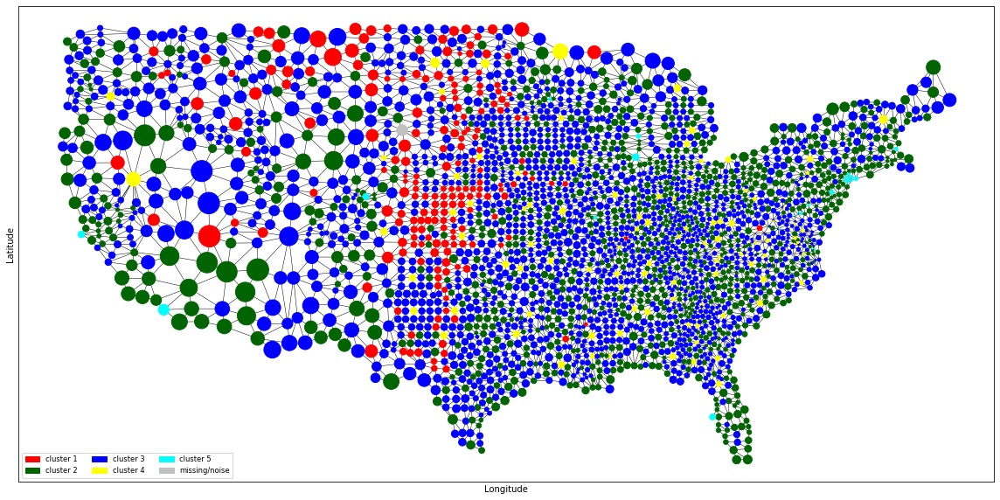

In [56]:
colormap_nodes = []
for fips in G.nodes:
    if classes[fips]==N_clusters:
        colormap_nodes.append(colormap_str[-1])
    else:
        colormap_nodes.append(colormap_str[classes[fips]])

plt.figure(figsize=(20,10))
nx.drawing.nx_pylab.draw_networkx(
        G, 
        pos=location_dictionary,
        node_size=list(dist_min_dict.values()), #10,
        node_color=colormap_nodes,
        width=0.5,
        with_labels=False,
        label='a')
plt.xlabel("Longitude")
plt.ylabel("Latitude")

patchs = []
for i in range(N_clusters):
    patchs.append(mpatches.Patch(color=colormap_str[i], label=f'cluster {i+1}'))
patchs.append(mpatches.Patch(color='silver', label='missing/noise'))

plt.legend(handles=patchs, fontsize='small', ncol=-(-len(patchs)//2), loc='lower left')
plt.show()

In [62]:
"""
Find class mapper(permutation) from classes_old to classes
"""
from itertools import permutations

with open(f'{homedir}/JK/clustering/n_clusters={N_clusters}_kmeans_extended.txt', 'r') as f:
    classes = eval(f.read())
with open(f'{homedir}/JK/clustering/n_clusters={N_clusters}_kmeans.txt', 'r') as f:
    classes_old = eval(f.read())

class_mapper = []
counter = 0
for sgm in permutations(list(range(N_clusters))):
    clsmpr = list(sgm) + [N_clusters]
    _ = 0
    for fips, i in classes.items():
        if classes_old[fips]==clsmpr[i]:
            _ += 1
    if counter < _:
        class_mapper = clsmpr
        counter = _

print(class_mapper, counter/len(classes))    # overlapping ratio

[4, 3, 0, 1, 2, 5] 0.8565928777670837


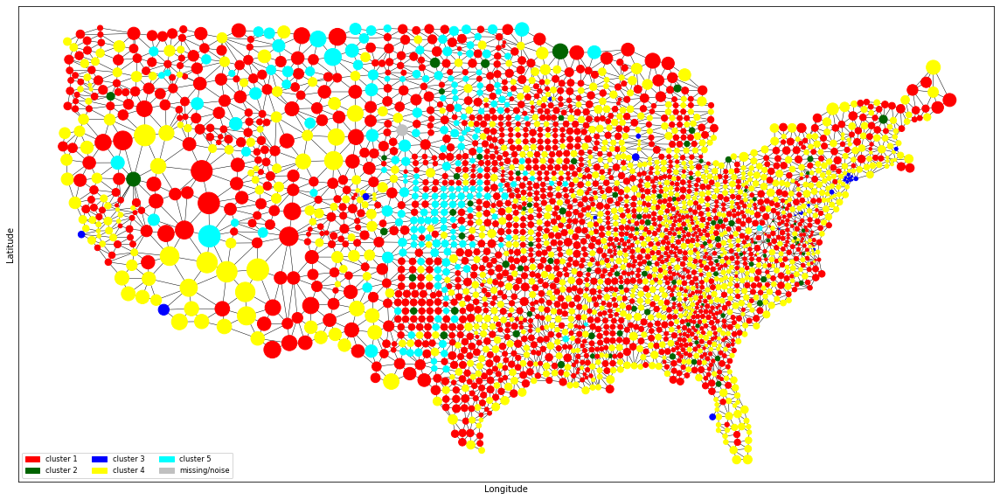

In [63]:
colormap_nodes = []
for fips in G.nodes:
    if classes[fips]==N_clusters:
        colormap_nodes.append(colormap_str[-1])
    else:
        colormap_nodes.append(colormap_str[class_mapper[classes[fips]]])

plt.figure(figsize=(20,10))
nx.drawing.nx_pylab.draw_networkx(
        G, 
        pos=location_dictionary,
        node_size=list(dist_min_dict.values()), #10,
        node_color=colormap_nodes,
        width=0.5,
        with_labels=False,
        label='a')
plt.xlabel("Longitude")
plt.ylabel("Latitude")

patchs = []
for i in range(N_clusters):
    patchs.append(mpatches.Patch(color=colormap_str[i], label=f'cluster {i+1}'))
patchs.append(mpatches.Patch(color='silver', label='missing/noise'))

plt.legend(handles=patchs, fontsize='small', ncol=-(-len(patchs)//2), loc='lower left')
plt.show()

In [64]:
# show on a map - whole data set
# with open(f'{homedir}/JK/clustering/n_clusters=5_kmeans_extended.txt', 'r') as f:
#     classes = eval(f.read())

cluster_df = pd.DataFrame({'fips':list(classes.keys()), 'class':[str(8) if i==5 else str(i) for i in list(classes.values())]})
colormap_dict = dict(zip([str(i) for i in range(len(colormap_str))], colormap_str))

with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

fig = px.choropleth_mapbox(cluster_df, geojson=counties, locations='fips', color='class',
                        #    featureidkey="properties.error",
                           color_discrete_map=colormap_dict,
                           mapbox_style="carto-positron",
                           zoom=3, center = {"lat": 37.0902, "lon": -95.7129},
                           opacity=0.5,
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

with open(f'{homedir}/JK/plotly/n_clusters=5_kmeans_extended.html', 'a') as f:
    f.write(fig.to_html(full_html=False, include_plotlyjs='cdn'))

## Inspection on clusters

In [33]:
start_date = '2020-04-25'
daily_df = pd.read_csv(f'{homedir}/data/us/covid/nyt_us_counties_daily.csv')
daily_df['fips'] = daily_df['fips'].apply(correct_FIPS)
end_date = daily_df['date'].max()
preperiod_df = daily_df[(daily_df['date'] < start_date)]
daily_df = daily_df[(daily_df['date'] <= end_date)  & (daily_df['date'] >= start_date)]

prev_active_fips = set(preperiod_df.fips.unique())
curr_active_fips = set(daily_df.fips.unique())
all_fips = set(FIPS_full)
covid_active_fips = prev_active_fips.intersection(all_fips).intersection(curr_active_fips)
inactive_fips = all_fips - prev_active_fips - curr_active_fips
new_active_fips = (curr_active_fips - prev_active_fips).intersection(all_fips)

In [36]:
print(len(covid_active_fips), len(inactive_fips))

2785 358


In [38]:
inactive_counter = [0 for _ in range(9)]
total_counter = [0 for _ in range(9)]
for fips, i in classes.items():
    total_counter[i] += 1
    if (fips in inactive_fips):
        inactive_counter[i] += 1
for i in range(9):
    print(inactive_counter[i] / total_counter[i]) ### Blue hits the inactive counties

0.010714285714285714
0.09357652656621729
0.5272727272727272
0.14814814814814814
0.007692307692307693
0.014084507042253521
0.16624685138539042
0.0054446460980036296
1.0


## Demo + Mobi

In [19]:
'''
Need clustering package w/ custom distance ftn
First generate distance matrix?
Possible options:
nltk.cluster.kmeans
'''
# retrieve mobility data. The data has been collected from from March 1st
df_mobility = pd.read_csv(f'{homedir}/data/us/mobility/DL-us-mobility-daterow.csv', parse_dates=['date'], usecols=['date', 'fips', 'm50', 'm50_index'])
df_mobility = df_mobility[~np.isnan(df_mobility.fips)]
df_mobility['fips'] = df_mobility['fips'].apply(correct_FIPS)
# df_mobility.set_index(['date', 'fips'], inplace=True)
df_mobility.head()

,date,fips,m50,m50_index
0,2020-03-01,1,8.331,79
1,2020-03-02,1,10.398,98
2,2020-03-03,1,10.538,100
3,2020-03-04,1,10.144,96
4,2020-03-05,1,10.982,104


In [ ]:
berkeley_selected = fix_FIPS(berkeley, fipslabel='countyFIPS', reduced=True)

kNNdata = pd.DataFrame()
kNNdata['PopRatioMale2017'] = berkeley_selected['PopTotalMale2017'] / (berkeley_selected['PopTotalMale2017']+berkeley_selected['PopTotalFemale2017'])
kNNdata['PopRatio65+2017'] = berkeley_selected['PopulationEstimate65+2017'] / (berkeley_selected['PopTotalMale2017']+berkeley_selected['PopTotalFemale2017'])
kNNdata['PopulationDensityperSqMile2010'] = berkeley_selected['PopulationDensityperSqMile2010'] / 260
kNNdata['MedicareEnrollment,AgedTot2017'] = berkeley_selected['MedicareEnrollment,AgedTot2017'] / (berkeley_selected['PopTotalMale2017']+berkeley_selected['PopTotalFemale2017'])
kNNdata['#Hospitals'] = 20000 * berkeley_selected['#Hospitals'] / (berkeley_selected['PopTotalMale2017']+berkeley_selected['PopTotalFemale2017'])
kNNdata['#ICU_beds'] = 10000 * berkeley_selected['#ICU_beds'] / (berkeley_selected['PopTotalMale2017']+berkeley_selected['PopTotalFemale2017'])
for i in range(len(popularity_type_Male)):
    kNNdata['PopRatio'+popularity_type_Male[i][3:]] = berkeley_selected[popularity_type_Male[i]] / (berkeley_selected[popularity_type_Male[i]]+berkeley_selected[popularity_type_Fmle[i]])
    kNNdata['PopRatio'+popularity_type_Male[i][7:]] = berkeley_selected[popularity_type_Male[i]] / (berkeley_selected['PopTotalMale2017']+berkeley_selected['PopTotalFemale2017'])
kNNdata['HeartDiseaseMortality'] = berkeley_selected['HeartDiseaseMortality'] / 100
kNNdata['StrokeMortality'] = berkeley_selected['StrokeMortality'] / 50
kNNdata['DiabetesPercentage'] = berkeley_selected['DiabetesPercentage'] / 10
kNNdata['Smokers_Percentage'] = (berkeley_selected['Smokers_Percentage'] - 2) / 20

kNNdata.fillna(0, inplace=True)

N_clusters = 8

X = kNNdata.to_numpy()
kmeans = MiniBatchKMeans(n_clusters=N_clusters)
kmeans.fit(X)
kmeans.cluster_centers_